# Support Vector Machines 
## Instructions
1. Use any dataset from https://archive.ics.uci.edu/datasets?Task=Clustering&skip=0&take=10&sort=desc&orderBy=NumHits&search=&Area=Biology
2. Each student should have a unique dataset otherwise no points will be given, so you need to discuss with your classmate.

**TASK: Take 10 moderately sized subsamples your dataset and create a correlation plot for each subsample**

**TASK (Classification): If your problem is a classification problem visually check if the target variable is imbalanced**

**TASK (Regression): If your problem is a regression problem visually the distribution of your target variabe**

**TASK: Take 10 moderately sized subsamples and create a pairplot of the feature variable in relation to the target variable**

**TASK: Create a clustermap with seaborn to explore the relationships between variables.**

**TASK: Perform SVM modelling and check the performance of your model, improve the performance of your model using grdisearch**

       accX      accY      accZ     gyroX     gyroY     gyroZ timestamp  \
0 -0.496517  3.785628  8.954828 -0.142849 -0.126159 -0.022539   34:22.9   
1 -0.462388  3.869603  9.281898  0.084349  0.096695  0.092130   34:23.0   
2 -0.296084  3.820505  8.930728  0.061763  0.051543  0.071287   34:23.1   
3 -0.469723  3.890110  8.744067  0.007641  0.028679  0.109433   34:23.2   
4 -0.472418  4.109105  8.941207 -0.123640  0.099057  0.051943   34:23.3   

   Activity  
0         1  
1         1  
2         1  
3         1  
4         1  
accX         float64
accY         float64
accZ         float64
gyroX        float64
gyroY        float64
gyroZ        float64
timestamp     object
Activity       int64
dtype: object
       accX      accY      accZ     gyroX     gyroY     gyroZ  Activity
0 -0.496517  3.785628  8.954828 -0.142849 -0.126159 -0.022539         1
1 -0.462388  3.869603  9.281898  0.084349  0.096695  0.092130         1
2 -0.296084  3.820505  8.930728  0.061763  0.051543  0.071287      

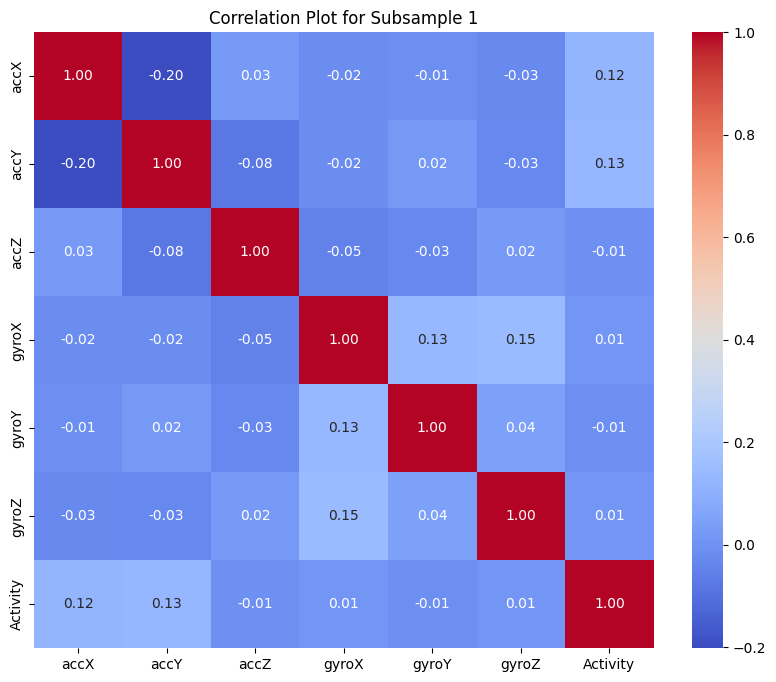

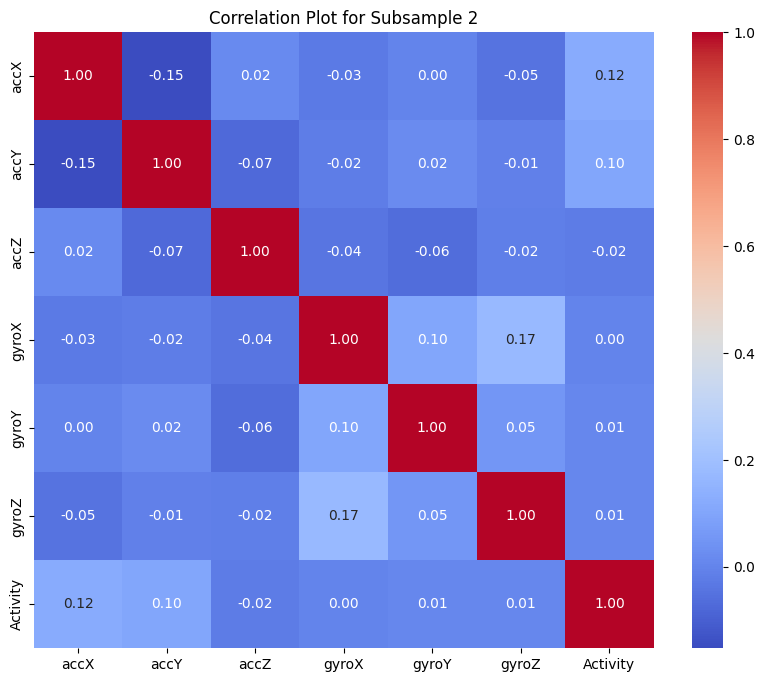

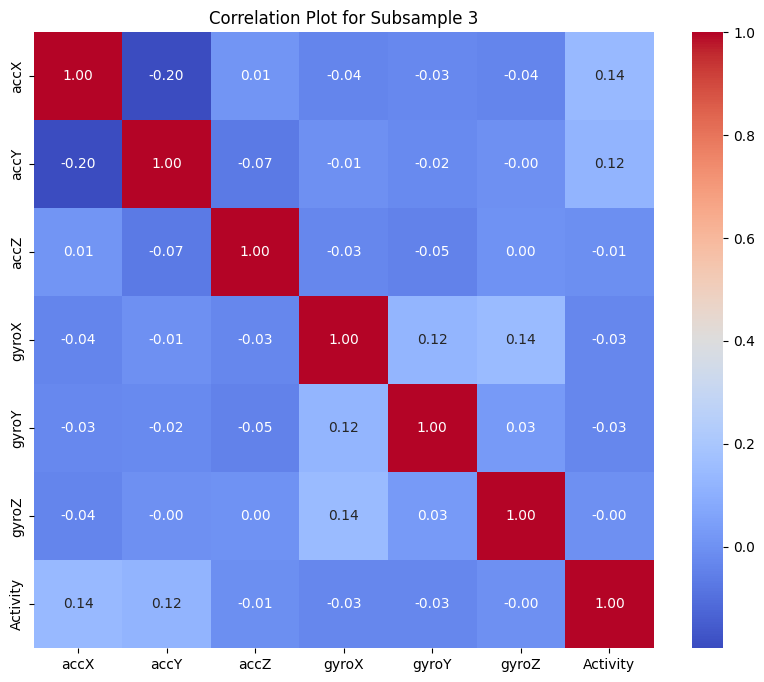

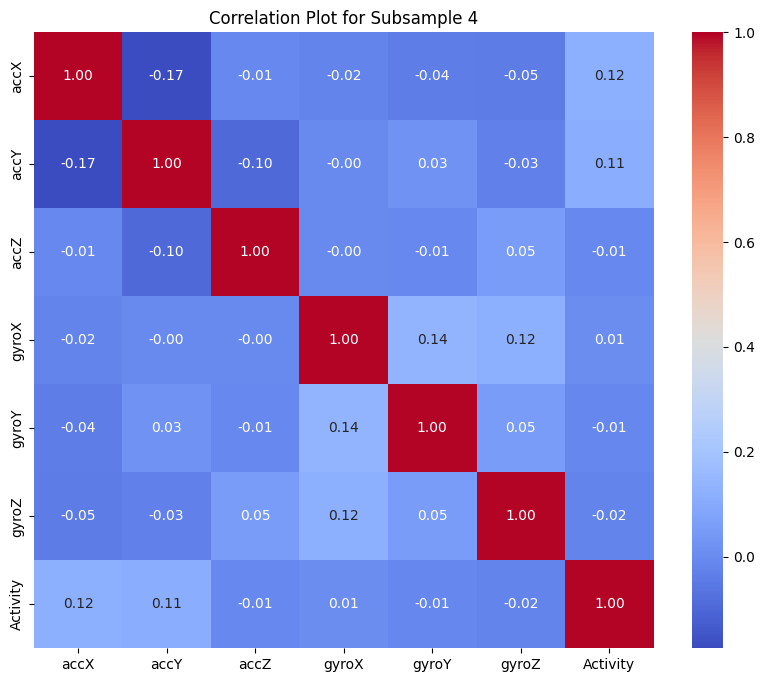

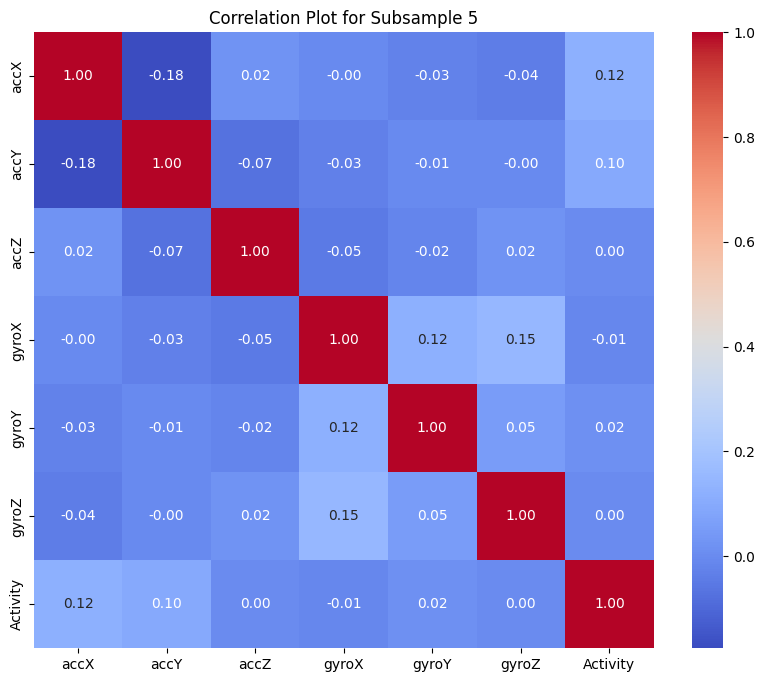

...

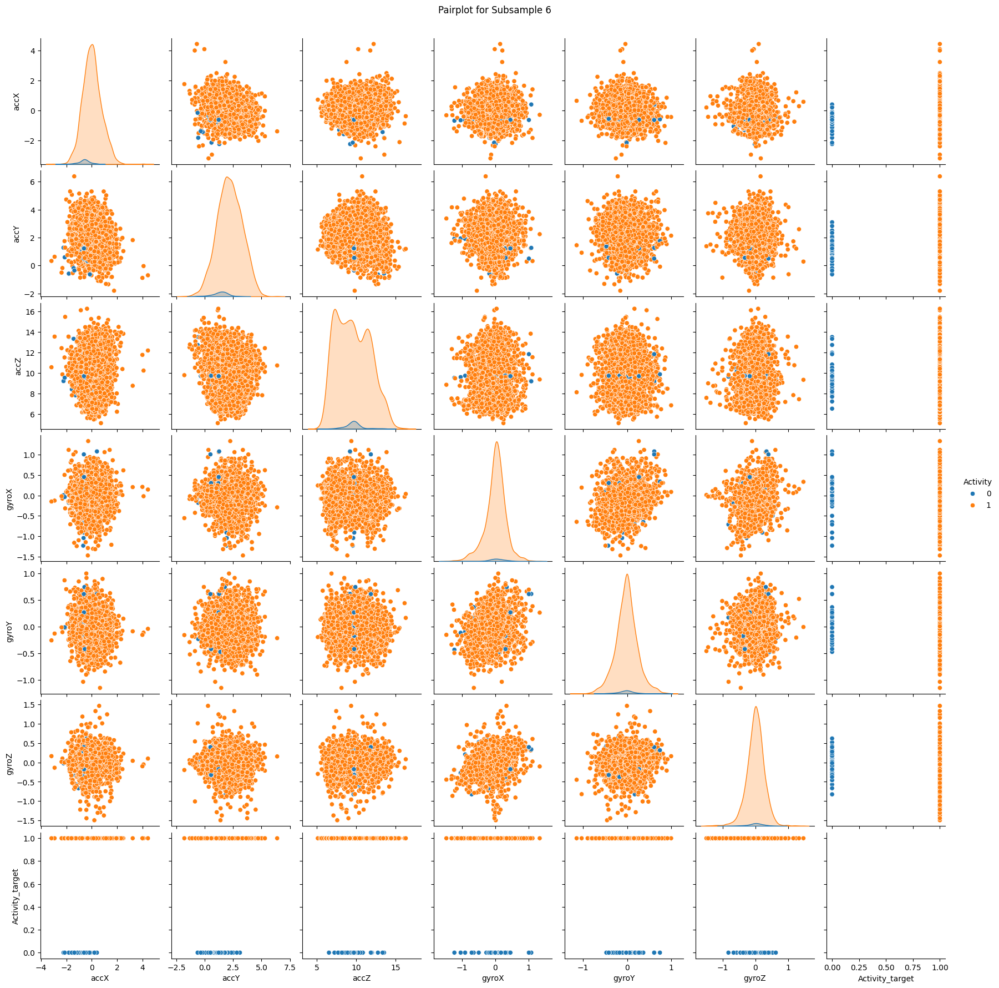

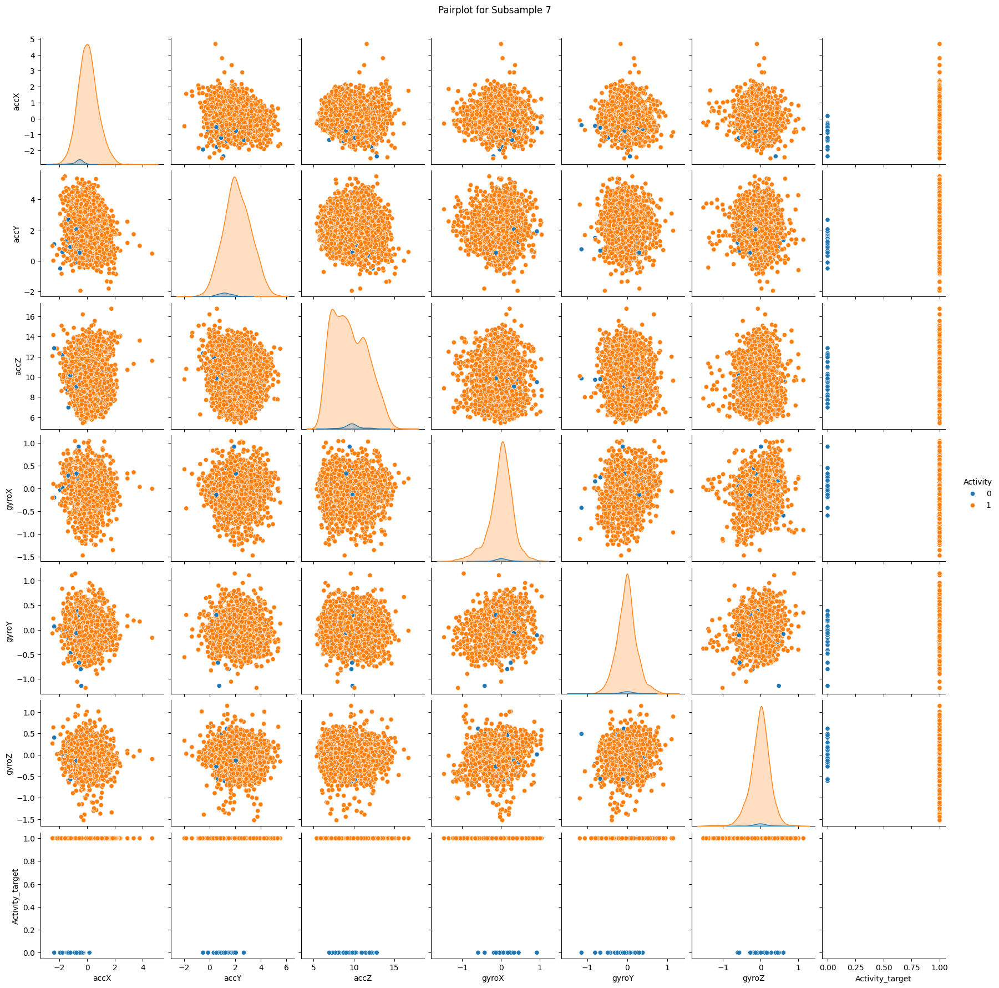

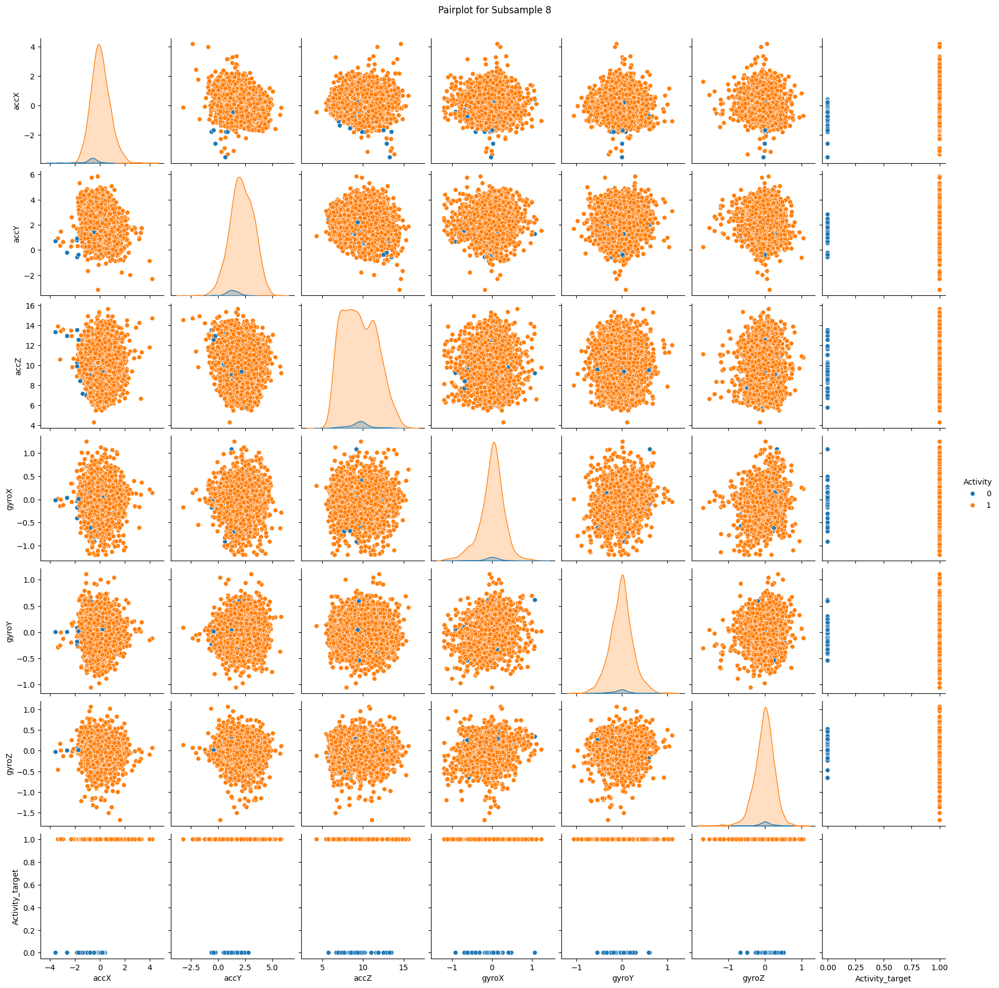

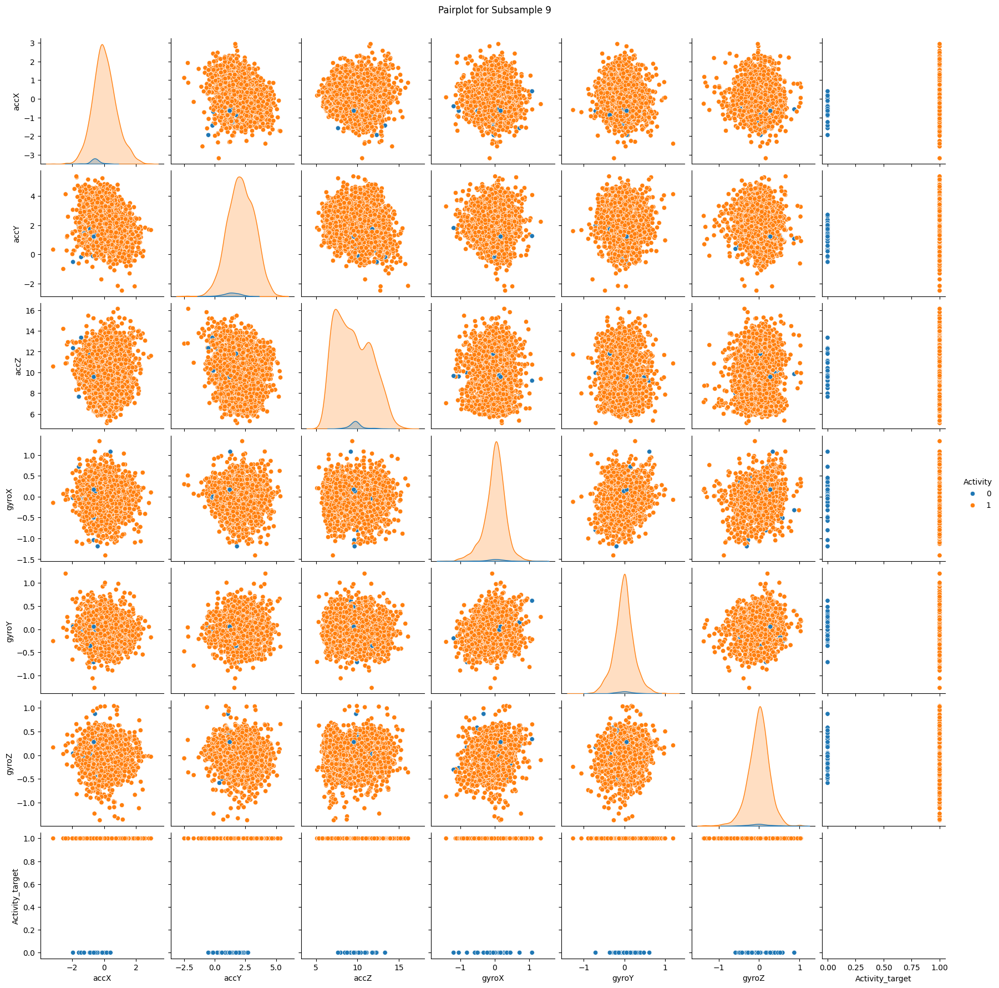

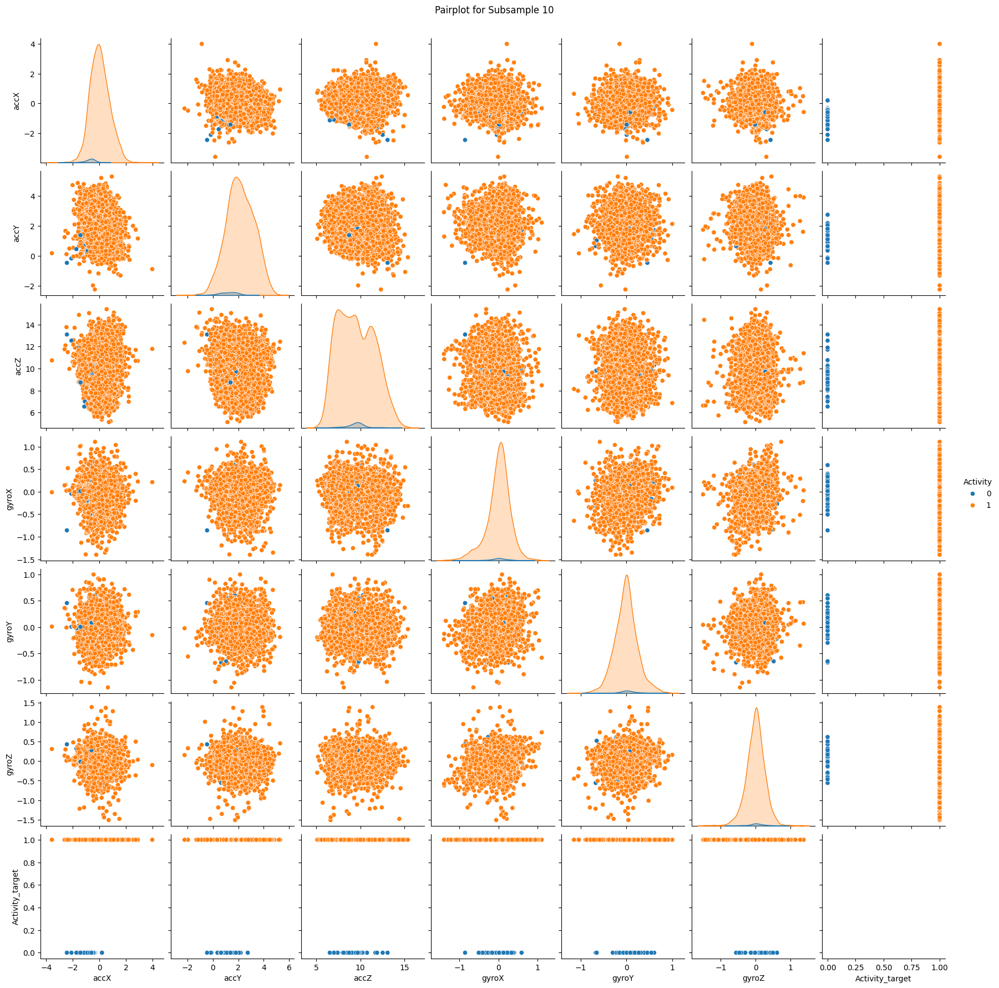

<Figure size 1200x1000 with 0 Axes>

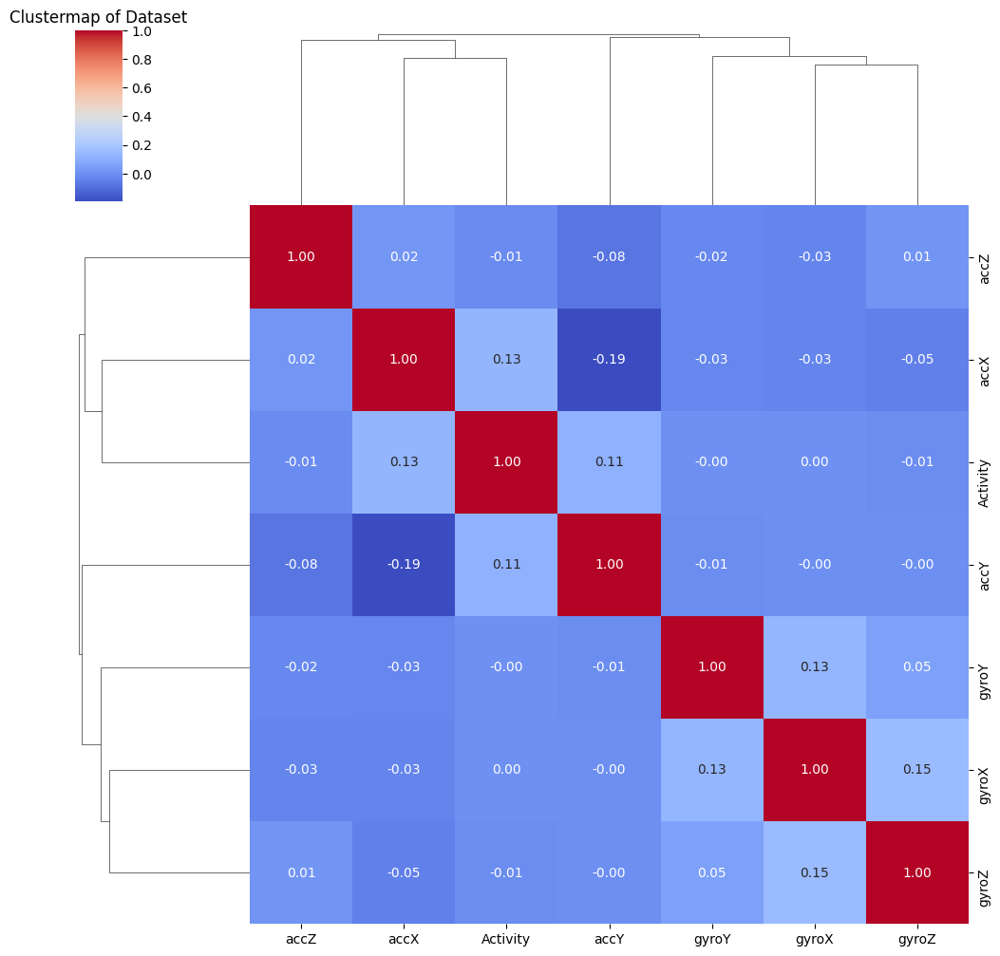

ValueError: could not convert string to float: '13:31.3'

In [30]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

file_path = 'accelerometer_gyro_mobile_phone_dataset.csv'
df = pd.read_csv(file_path)

print(df.head())
print(df.dtypes)

numeric_df = df.select_dtypes(include=[np.number])
print(numeric_df.head())

### Task 1: Take 10 moderately sized subsamples and create a correlation plot for each subsample
subsample_size = int(len(df) * 0.1)  # 10% of the dataset for each subsample
subsamples = [numeric_df.sample(subsample_size, random_state=i) for i in range(10)]

for i, subsample in enumerate(subsamples):
    plt.figure(figsize=(10, 8))
    sns.heatmap(subsample.corr(), annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Correlation Plot for Subsample {i+1}')
    plt.show()

### Task 2: Check if the target variable is imbalanced (Classification Problem)
target = 'Activity'

target_counts = df[target].value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(x=target_counts.index, y=target_counts.values)
plt.xlabel('Activity Classes')
plt.ylabel('Count')
plt.title('Distribution of Activity Variable')
plt.show()

### Task 3: Visualize the distribution of the target variable (Regression Problem)

### Task 4: Take 10 moderately sized subsamples and create a pairplot
for i, subsample in enumerate(subsamples):
    subsample_with_target = subsample.join(df[[target]], how='inner', rsuffix='_target')
    sns.pairplot(subsample_with_target, hue=target)
    plt.suptitle(f'Pairplot for Subsample {i+1}', y=1.02)
    plt.show()

### Task 5: Create a clustermap with seaborn to explore the relationships between variables

plt.figure(figsize=(12, 10))
sns.clustermap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Clustermap of Dataset')
plt.show()

### Task 6: Perform SVM modelling and check the performance of your model, improve the performance using GridSearch
X = df.drop(columns=[target])
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

svm_model = SVC()
svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

param_grid = {'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001], 'kernel': ['rbf', 'poly', 'sigmoid']}
grid_search = GridSearchCV(SVC(), param_grid, refit=True, verbose=2)
grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test)

print("Best Model Classification Report:")
print(classification_report(y_test, y_pred_best))

# Visualize
cm = confusion_matrix(y_test, y_pred_best)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()
plt.title('Confusion Matrix for Best Model')
plt.show()
